In [ ]:
import IPython.display as idisplay
import librosa
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d
import soundfile as sf

In [ ]:
filename="./original.wav"
sgn, fs = librosa.load(filename, sr=None, mono=False)

idisplay.display(idisplay.Audio(sgn, rate=fs))

This code increases the sampling rate (`updated_fs`) without changing the number of samples in the signal, resulting in faster playback and a higher pitch. However, the sound quality is not controlled, and it may contain aliasing artifacts if the signal was not sampled sufficiently.

In [ ]:
idisplay.display(idisplay.Audio(sgn, rate=fs * 2 ** (-5 / 12)))
sf.write("./sped_up.wav", sgn.transpose(), int(fs * 2 ** (-5 / 12)))

In [ ]:
def sola_pitch_shift(input_sgn: np.array, window_length: int,
                     hop_length: int, semitone_shift: int
                     ) -> tuple[np.array, float]:
  hanning_window = np.hanning(window_length)
  scaling = 2 ** (semitone_shift / 12)
  scaled_hop = int(hop_length * scaling)
  channels, sgn_length = input_sgn.shape

  output_length = int(np.ceil(sgn_length / hop_length) * scaled_hop) + window_length
  output = np.zeros((channels, output_length))

  # iterate through hop points
  for i in range(0, sgn_length, hop_length):
    clipped_len = min(window_length, sgn_length - i)
    window = input_sgn[:, i:i + clipped_len] * hanning_window[None, :clipped_len]

    idx = int(i * scaling)
    if idx > 0:
      # amount of samples it can move window backwards
      idx_tmp = max(0, idx - int(clipped_len / 4))
      clipped_input = input_sgn[0, idx_tmp:idx_tmp + clipped_len]
      # np.correlation needs clipped_input to be non-empty
      if clipped_input.size != 0:
        cross_corr = np.correlate(window[0], clipped_input, mode='valid')
        idx = np.argmax(cross_corr) + idx_tmp

    output[:, idx:idx + clipped_len] += window

  return output, fs * scaling

In [ ]:
sola_output, sola_fs = sola_pitch_shift(sgn, 5000, 2000, -5)
idisplay.display(idisplay.Audio(sola_output, rate=sola_fs))
sf.write("./sola.wav", sola_output.transpose(), int(sola_fs))

**Linear reconstruction** can be used to interpolate new data points between existing sound samples to create a modified version of the sound with a higher or lower sampling frequency.

In [ ]:
def create_frames(input_sgn: np.array, hop_length: int, window_size: int
                  ) -> tuple[np.array, float]:
  sample_count, channels = input_sgn.shape
  frame_count = int(np.floor((sample_count - window_size) / hop_length))

  # create a matrix with time slices for stereo
  frames = np.zeros((frame_count, window_size, channels))

  # create frames and store them in one matrix
  for index in range(frame_count):
    time_index = index * hop_length
    for i in range(channels):
      frames[index, :, i] = input_sgn[time_index:time_index + window_size, i]

  return frames, frame_count

def fuse_frames(frames: np.array, hop_length: int) -> np.array:
  frame_count, frame_size, channels = frames.shape
  output = np.zeros(frame_count * hop_length - hop_length + frame_size)
  time = 0

  for index in range(frame_count):
    for i in range(channels):
      output[time:time + frame_size] += frames[index, :, i]
    time += hop_length

  return output

def pitch_shift(input_sgn: np.array, window_length: int,
                hop_length: int, semitone_shift: int
                ) -> np.array:
  scaling = 2 ** (semitone_shift / 12)
  scaled_hop = int(hop_length * scaling)
  hanning_window = np.hanning(window_length)
  input_sgn = input_sgn.transpose()

  # padding
  sgn = np.concatenate((np.zeros((hop_length * 3, input_sgn.shape[1])), input_sgn), axis=0)
  sgn_length, channels = sgn.shape

  # create frames
  frames, window_count = create_frames(sgn, hop_length, window_length)
  output = np.zeros((window_count, window_length, channels))

  # phase vocoder variables
  cumulative_phase = np.zeros((window_length, channels))
  previous_phase = np.zeros((window_length, channels))

  for idx in range(window_count):
    frame = frames[idx, :, :]  # Stereo frame

    frame_windowed = frame.copy()
    for i in range(channels):
      frame_windowed[:, i] *= hanning_window
    frame_windowed /= np.sqrt((window_length / hop_length) / 2)

    # FFT analysis
    frame_fft = np.fft.fft(frame_windowed, axis=0)
    magnitude = np.abs(frame_fft)
    phase = np.angle(frame_fft)

    # Phase difference for all channels
    delta_phi = phase - previous_phase
    previousPhase = phase

    # remove expected phase difference
    delta_phi_itermit = delta_phi - hop_length * 2 * np.pi * np.arange(window_length)[:, np.newaxis] / window_length
    delta_phi_prime = (delta_phi_itermit + np.pi) % (2 * np.pi) - np.pi

    # true frequency for each channel
    true_frequency = 2 * np.pi * np.arange(window_length)[:, np.newaxis] / window_length + delta_phi_prime / hop_length
    cumulative_phase += scaled_hop * true_frequency

    # reconstruct the frame
    output_frame = np.real(np.fft.ifft(magnitude * np.exp(1j * cumulative_phase), axis=0))
    output[idx] = (output_frame * hanning_window[:, np.newaxis]) / np.sqrt((window_length / scaled_hop) / 2)

  # Finalize by overlap-add
  output_stretched = fuse_frames(output, scaled_hop)

  # calculate actual and target length
  target_length = sgn_length
  output_length = len(output_stretched)

  # if lengths match, no further reconstruction is needed
  if output_length == target_length:
    return output_stretched

  x_stretched = np.arange(output_length)
  x_resambled = np.linspace(0, output_length - 1, target_length)

  # interpolate for both channels simultaneously (as stereo)
  interpolate_func = interp1d(x_stretched, output_stretched, axis=0,
                              kind='linear', fill_value="extrapolate")

  # interpolate the outputTimeStretched signal to match the target length
  return interpolate_func(x_resambled)

In [ ]:
vocoder_output = pitch_shift(sgn, 2048, 512, -5)
idisplay.display(idisplay.Audio(vocoder_output, rate=fs))
sf.write("./vocoder.wav", vocoder_output.transpose(), int(fs))

In [ ]:
librosa_output = librosa.effects.pitch_shift(y=sgn, sr=fs, n_steps=-5)
idisplay.display(idisplay.Audio(librosa_output, rate=fs))
sf.write("./librosa.wav", librosa_output.transpose(), int(fs))

In [ ]:
def plot_spectrogram(signal, sr, title):
  nfft = 1024
  overlap = 512
  spec, freqs, times, _ = plt.specgram(signal, NFFT=nfft, Fs=sr, noverlap=overlap)
  plt.imshow(10 * np.log10(spec), aspect='auto', origin='lower', cmap='jet',
              extent=[times.min(), times.max(), freqs.min(), freqs.max()])

  plt.colorbar(label='Intensity [dB]')
  plt.title(title)
  plt.xlabel('Time [s]')
  plt.ylabel('Frequency [Hz]')

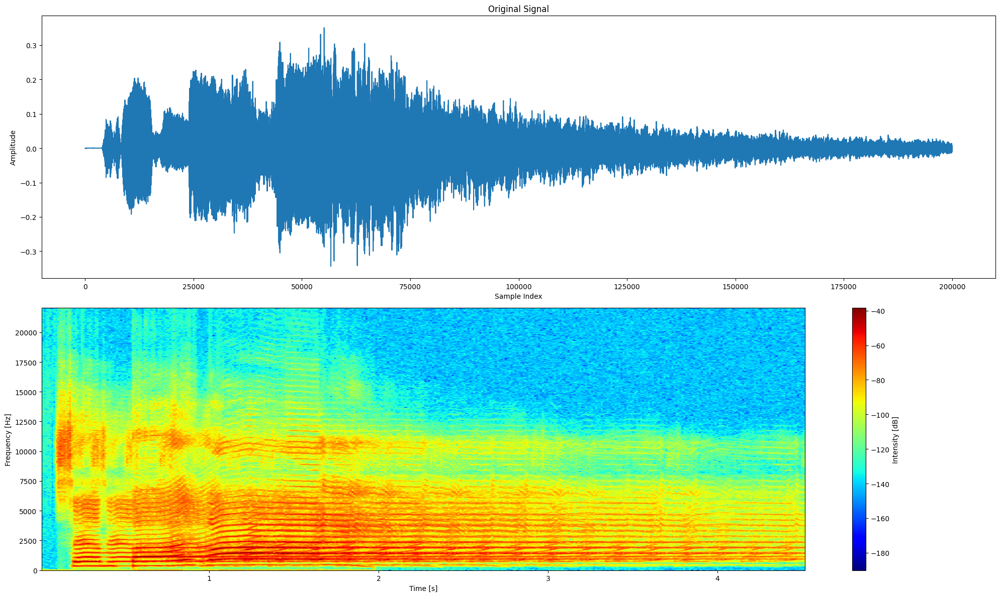

In [ ]:
plt.figure(figsize=(20, 12))

plt.subplot(2, 1, 1)
plt.plot(sgn.transpose()[:200000, 0])
plt.title('Original Signal')
plt.xlabel('Sample Index')
plt.ylabel('Amplitude')

plt.subplot(2, 1, 2)
plot_spectrogram(sgn.transpose()[:200000,0], fs, '')

plt.tight_layout()
plt.show()

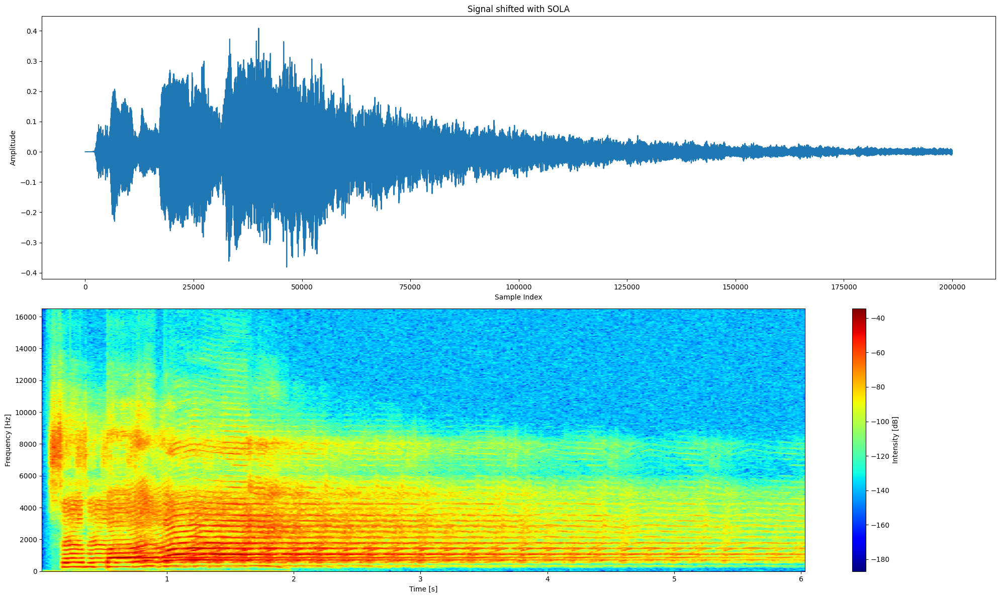

In [ ]:
plt.figure(figsize=(20, 12))

plt.subplot(2, 1, 1)
plt.plot(sola_output.transpose()[:200000, 0])
plt.title('Signal shifted with SOLA')
plt.xlabel('Sample Index')
plt.ylabel('Amplitude')

plt.subplot(2, 1, 2)
plot_spectrogram(sola_output.transpose()[:200000, 0], sola_fs, '')

plt.tight_layout()
plt.show()

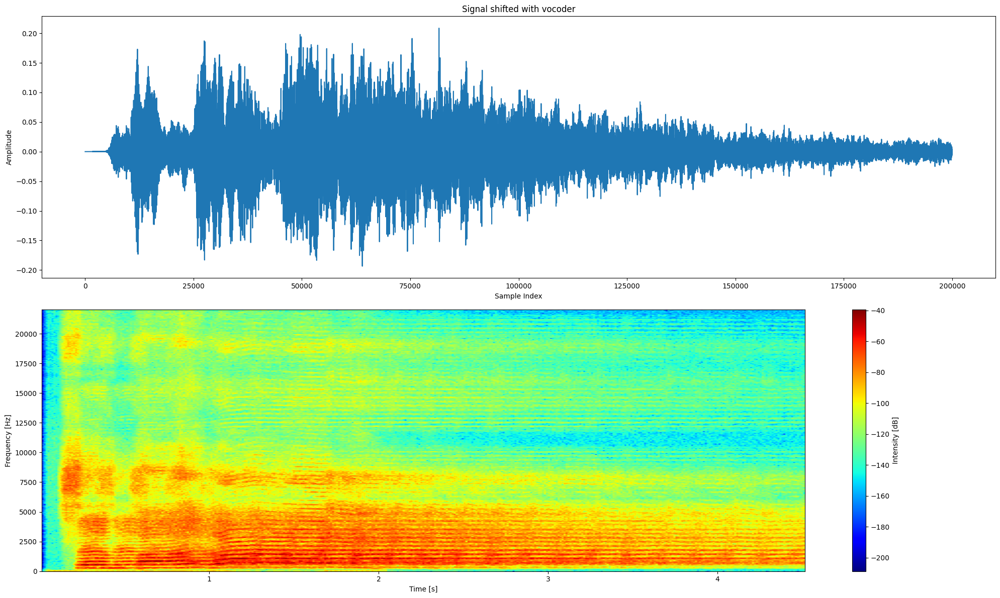

In [ ]:
plt.figure(figsize=(20, 12))

plt.subplot(2, 1, 1)
plt.plot(vocoder_output[:200000])
plt.title('Signal shifted with vocoder')
plt.xlabel('Sample Index')
plt.ylabel('Amplitude')

plt.subplot(2, 1, 2)
plot_spectrogram(vocoder_output[:200000], fs, '')

plt.tight_layout()
plt.show()

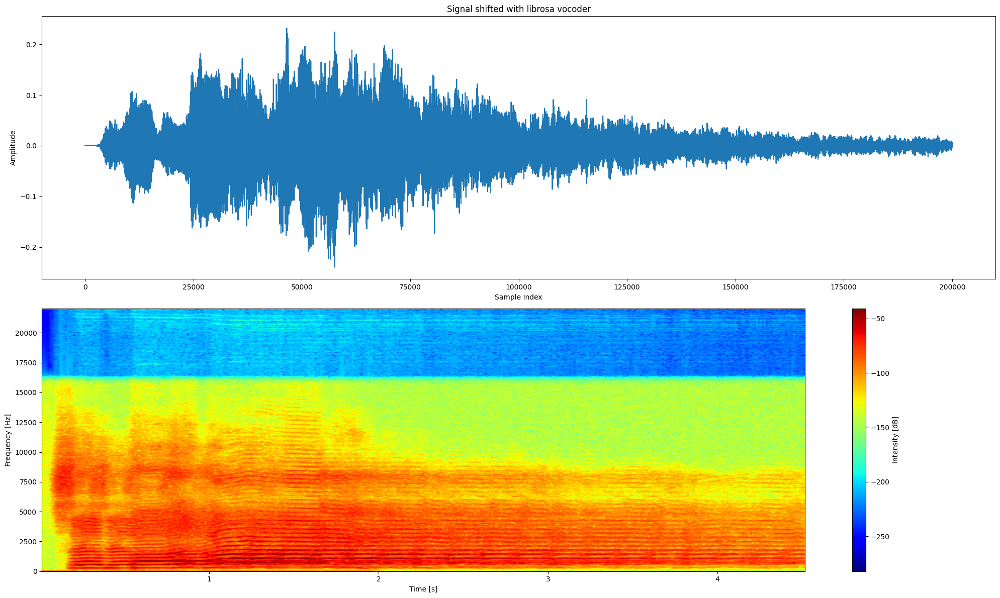

In [ ]:
plt.figure(figsize=(20, 12))

plt.subplot(2, 1, 1)
plt.plot(librosa_output.transpose()[:200000,0])
plt.title('Signal shifted with librosa vocoder')
plt.xlabel('Sample Index')
plt.ylabel('Amplitude')

plt.subplot(2, 1, 2)
plot_spectrogram(librosa_output.transpose()[:200000,0], fs, '')

plt.tight_layout()
plt.show()

In [ ]:
sgn.shape

(2, 588000)